## Lab Assignment: Reinforcement learning

#### Lab team: 12

##### Name (member 1): Lucas Miranda López

##### Name (member 2): Iván Domínguez Hernández

* Please include your full name at the beginning of all submitted files.
* Make sure the presentation is well-structured: the report will be evaluated not only for correctness, but also for clarity, conciseness, and completeness.
* Make use of figures and tables to summarize the results and illustrate the discussions.
* If external material is used, the sources must be cited. 
* Include references in APA format https://pitt.libguides.com/citationhelp/apa7. Lack or poorly formatted references can be penalized.
* A generative AI tool can be used for consultation. You must specify the tool used in your report.
* You are not allowed to use a generative AI tool to generate code.

Submit a single `.zip` file, whose name has the format `AA3_P04_teamCode_lastName1_lastName2.zip` 
The name must not include graphical accents, spaces, uppercase letters, or special characters.

For example: `AA3_P04_G03_munyoz_deLaRosa.zip`

This compressed file must include the following files:

* This Python notebook with the solutions of the exercises. The notebook should include only code snippets, figures, tables, derviations and explanations (with LaTex if necessary) in Markdown cells. Handwritten material can be included in the Python notebook as images. Functions should be defined in a separate `.py` file, not in the notebook.
* The necessary `.py` and addional files to ensure the Python notebook code can be executed sequentially without errors.
* A PDF file generated from the notebook (Export the notebook as an HTML file. Open the HTML file in a Browser and print it as a PDF file). 

Make sure that all the code cells can be executed squentially without errors (Kernel -> Restart & Run All). Exectution and formatting errors will be penalized.

Evaluation criteria:
* [6 points] Quality of the report (correctness, clarity, conciseness, completeness).
* [3 points] Quality of the code (correctness, adherence to a Python style guide -for instance, Google's-, comments, functional decomposition).
* [1 point]  References.                                                                   

# Training a reinforcemnt learning agent at the gymnasium 🚀

### 📚 RL-environment:

- Python and NumPy
- [Gymnasium](https://gymnasium.farama.org/)

### 🎮 Environment:

- [FrozenLake-v1](https://gymnasium.farama.org/environments/toy_text/frozen_lake/)


### 📚 Pygame:

https://www.pygame.org/wiki/about

## Exercise 1: The gymnasium

#### TO DO:  Complete the gymnasium tutorials
* Basic usage: https://gymnasium.farama.org/introduction/basic_usage/
* Training an RL-agent: https://gymnasium.farama.org/introduction/train_agent/

In [1]:
%load_ext autoreload
%autoreload 2

import numpy as np
import matplotlib.pyplot as plt
import gymnasium as gym
import imageio
import os

from tqdm.notebook import tqdm
import rl_utils
import time
from IPython.display import display, clear_output


from reinforcement_learning import (
    sarsa_learning,
    q_learning, 
    greedy_policy,
    epsilon_greedy_policy,
)

In [2]:
# Install packages if needed
# !pip install pygame
# !pip install gymnasium

## Exercise 2: Q-learning

We're now ready to code our Q-Learning algorithm 🔥

## Step 0: Set up and understand Frozen Lake environment

Let's begin with a simple 4x4 map and non-slippery, meaning the agent always moves in the desired direction.

We add a parameter called `render_mode` that specifies how the environment should be visualised. In our case because we **want to record a video of the environment at the end, we need to set render_mode to rgb_array**.

As [explained in the documentation](https://gymnasium.farama.org/api/env/#gymnasium.Env.render) “rgb_array”: Return a single frame representing the current state of the environment. 
A frame is a np.ndarray with shape (H, W, 3) representing RGB values for an H (height) times W (width) pixel image.

In [3]:
small_environment = gym.make(
    'FrozenLake-v1', 
    map_name='4x4', 
    is_slippery=False, 
    render_mode='rgb_array',
)

### Let's see what the environment looks like:

0
{'prob': 1} (Probability that the action has led to the current state)
There are  16  possible states
There are  4  possible actions
{0: 'Left', 1: 'Down', 2: 'Right', 3: 'Up'}


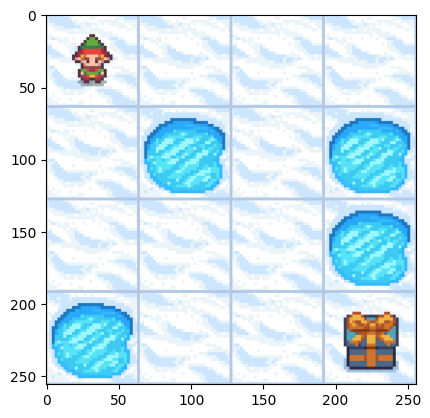

In [4]:
state, info = small_environment.reset()  # observation state
action_names = {0: 'Left', 1: 'Down', 2: 'Right', 3: 'Up'}

print(state)
print(info, '(Probability that the action has led to the current state)')
n_states = small_environment.observation_space.n
print("There are ", n_states, " possible states")

n_actions = small_environment.action_space.n
print("There are ", n_actions, " possible actions")
print(action_names)

fig, ax = plt.subplots()
game_image = ax.imshow(small_environment.render())


In [5]:
# Generate a random observed state
print("Observation state (randomly selected)", small_environment.observation_space.sample()) 

# Generate a random action from the current state
print("Action (randomly selected):", small_environment.action_space.sample())

Observation state (randomly selected) 2
Action (randomly selected): 3


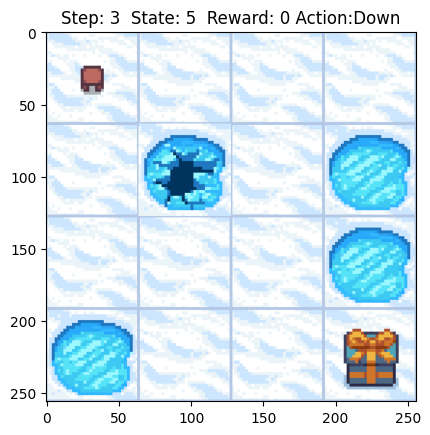

In [6]:
#  Generate an episode
obsevation, info = small_environment.reset()  # state state_state
fig, ax = plt.subplots()
game_image = ax.imshow(small_environment.render())

MAX_STEPS = 100
refresh_rate = 1 # in (1 / seconds)

episode_over = False
n_steps = 0
   
while not episode_over and n_steps < MAX_STEPS:
    n_steps += 1
    action = small_environment.action_space.sample()  

    state, reward, terminated, truncated, info = small_environment.step(action)
    episode_over = terminated or truncated
    
    ax.set_title(
        'Step: {}  State: {}  Reward: {} Action:{}'.format(
            n_steps, 
            state,
            reward,
            action_names[action],
        )
    )
    
    display(fig)
    time.sleep(1.0 / refresh_rate)
    clear_output(wait=True)  # Clear previous output
    game_image.set_data(small_environment.render())
    
small_environment.close()

## Step 1: Greedy and Epsilon greedy policies

Since Q-Learning is an **off-policy** algorithm, we have two policies. This means we're using a **different policy for acting and updating the value function**.

- Epsilon-greedy policy (acting policy)
- Greedy-policy (updating policy)

The greedy policy will also be the final policy we'll have when the Q-learning agent completes training. The greedy policy is used to select an action using the Q-table.

Epsilon-greedy is the training policy that handles the exploration/exploitation trade-off.

- With *probability 1 - ɛ* : **we do exploitation** (i.e. our agent selects the action with the highest state-action pair value).

- With *probability ɛ*: we do **exploration** (trying a random action).

As the training continues, we progressively **reduce the epsilon value since we will need less and less exploration and more exploitation.**

#### TO DO: Implement these policies in `reinforcement_learning.py`  

# Step 2: Train the RL agent 🏃

#### TO DO: Implement the Q-learning algorithm in `reinforcement_learning.py`


## Define the hyperparameters for the learning process ⚙️

The exploration related hyperparamters are some of the most important ones.

- We need to make sure that our agent **explores enough of the state space** to learn a good value approximation. To do that, we need to have progressive decay of the epsilon.
- If you decrease epsilon too fast (too high decay_rate), **you take the risk that your agent will be stuck** in a local optimum, since your agent didn't explore enough of the state space and hence can't solve the problem.

In [7]:
# Training hyperparameters

n_training_episodes = 1000
max_steps = 100 # Maximum number of steps per episode
learning_rate = 0.7          
gamma = 0.95 # Discount factor

# Exploration parameters
max_epsilon = 1.0  # Initial exploration probability
min_epsilon = 0.05  # Minimum exploration probability
decay_rate = 0.0005 # Exponential decay rate for the exploration probability

In [8]:
# Initialize Q-table
Qtable_small = np.zeros(
    (
        small_environment.observation_space.n, 
        small_environment.action_space.n
    )
)


# Learn Q-table
Qtable_small = q_learning(
    small_environment, 
    n_training_episodes,
    max_steps,
    learning_rate,
    gamma,
    min_epsilon, 
    max_epsilon, 
    decay_rate,  
    Qtable_small,
)

  0%|          | 0/1000 [00:00<?, ?it/s]

### Let's see what our Q-Learning table looks like now 👀

In [9]:
Qtable_small  

array([[0.73509189, 0.77378094, 0.77378094, 0.73509189],
       [0.73509189, 0.        , 0.81450625, 0.77378094],
       [0.77378094, 0.857375  , 0.77378094, 0.81450625],
       [0.81450625, 0.        , 0.77378093, 0.77378088],
       [0.77378094, 0.81450625, 0.        , 0.73509189],
       [0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.9025    , 0.        , 0.81450625],
       [0.        , 0.        , 0.        , 0.        ],
       [0.81450625, 0.        , 0.857375  , 0.77378094],
       [0.81450625, 0.9025    , 0.9025    , 0.        ],
       [0.857375  , 0.95      , 0.        , 0.857375  ],
       [0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.9025    , 0.95      , 0.857375  ],
       [0.9025    , 0.95      , 1.        , 0.9025    ],
       [0.        , 0.        , 0.        , 0.        ]])

### ...and what our agent is doing!

In [10]:
frames = rl_utils.generate_greedy_episode(small_environment, Qtable_small)
rl_utils.show_episode(frames, interval=250)

# A more challenging problem

We're ready now to find our way in more challenging environments 💥

In [11]:
large_environment = gym.make(
    'FrozenLake-v1', 
    map_name='8x8', 
    is_slippery=False, 
    render_mode='rgb_array'
)

n_states = large_environment.observation_space.n
print("There are ", n_states, " possible states")

n_actions = large_environment.action_space.n
print("There are ", n_actions, " possible actions")


There are  64  possible states
There are  4  possible actions


Clearly, those parameters won't be even close to solve the problem. So lets tune the hyperparameters one by one, as suggested in the literature:

- n_training_episodes = 10000

Q-learning is guaranteed to converge to $Q^*$ only if every state-action pair $(s,a)$ is visited infinitely often (Watkins & Dayan, 1992). In practice, a necessary condition is that the agent visits all $$ |\mathcal{S}| \times |\mathcal{A}| = 64 \times 4 = 256 $$ pairs at least once. By analogy with the coupon collector problem, the expected number of steps required to cover a state space of size $$|\mathcal{S}|$$ under uniform random exploration grows as $O(|\mathcal{S}| \log |\mathcal{S}|)$. Since the $8\times8$ map has $\times4$ more states than the 4×4 map (for which 1 000 episodes sufficed) scaling to 10000 episodes provides a conservative margin.

- gamma = 0.99

In FrozenLake, the only non-zero reward is $r = +1$ at the goal, received at step $T^*$ of the optimal trajectory. The discounted return along that trajectory is: $$G_0 = \gamma^{T^*-1} \cdot r_{T^*}$$ A standard measure of how far back the reward signal effectively propagates is the effective horizon: $$H_\gamma = \frac{1}{1 - \gamma}$$ For the 8×8 map, the length of the shortest path to the goal is approximately $T^* \approx 14$ steps. The table below compares the two candidate values:

| $\gamma$ | $H_\gamma$ | $\gamma^{14}$ |
|:---:|:---:|:---:|
| $0.95$ | $20$ | $0.488$ |
| $0.99$ | $100$ | $0.869$ |

With $\gamma = 0.95$, more than half the reward signal is lost by the time it propagates back to the initial state. With $\gamma = 0.99$, $87\%$ of the signal is preserved. As Sutton \& Barto (2018, Section 3.3) note, choosing $\gamma$ close to $1$ is appropriate when the agent must plan over long horizons.

- decay_rate = 0.0001

The exploration probability decays as:

$$\varepsilon_t = \varepsilon_{\min} + (\varepsilon_{\max} - \varepsilon_{\min})\, e^{-\lambda t}$$

A practical design criterion is that $\varepsilon_t$ should approach $\varepsilon_{\min}$ only after the agent has had sufficient time to cover the state space. Solving for the episode $t_{90}$ at which $\varepsilon$ has completed $90\%$ of its decay from $\varepsilon_{\max}$ to $\varepsilon_{\min}$:

$$e^{-\lambda\, t_{90}} = 0.1 \implies t_{90} = \frac{\ln 10}{\lambda} \approx \frac{2.303}{\lambda}$$

With $\lambda = 0.0001$, this gives $t_{90} \approx 2\,300$, meaning the agent explores aggressively through the first $23\%$ of training and consolidates its policy through the remaining $77\%$, according to the stablished training episodes. 

- learning_rate = 0.8

The Robbins–Monro conditions for asymptotic convergence of Q-learning require:

$$\sum_{t=0}^{\infty} \alpha_t = \infty \qquad \text{and} \qquad \sum_{t=0}^{\infty} \alpha_t^2 < \infty$$

A constant learning rate satisfies neither condition strictly, but in deterministic environments, where the transition $P(s' \mid s, a) \in \{0, 1\}$ carries no stochastic noise, each observed transition is exact. Consequently, a single Bellman update:

$$Q(s, a) \leftarrow Q(s, a) + \alpha \left[ r + \gamma \max_{a'} Q(s', a') - Q(s, a) \right]$$

is sufficient to correct any estimate, and a large constant $\alpha$ accelerates convergence without introducing variance. Sutton \& Barto (2018, Section 6.1) explicitly recommend constant step sizes for deterministic or non-stationary problems.

---

### References

Sutton, R. S., \& Barto, A. G. (2018). *Reinforcement learning: An introduction* (2nd ed.). MIT Press. https://incompleteideas.net/book/the-book-2nd.html

Watkins, C. J. C. H., \& Dayan, P. (1992). Q-learning. *Machine Learning, 8*(3–4), 279–292. https://doi.org/10.1007/BF00992698

In [12]:
# TO DO: Training hyperparameters

# Re-instantiate environment (generate_greedy_episode closes it)
large_environment = gym.make(
    'FrozenLake-v1',
    map_name='8x8',
    is_slippery=False,
    render_mode='rgb_array'
)

n_training_episodes = 10000
max_steps = 1000
learning_rate = 0.8
gamma = 0.99

# Exploration parameters
max_epsilon = 1.0
min_epsilon = 0.05
decay_rate = 0.0001

# Initialize Q-table
Qtable_large = np.zeros(
    (
        large_environment.observation_space.n, 
        large_environment.action_space.n
    )
)

# Learn Q-table
Qtable_large = q_learning(
    large_environment, 
    n_training_episodes,
    max_steps,
    learning_rate,
    gamma,
    min_epsilon, 
    max_epsilon, 
    decay_rate,  
    Qtable_large,
)

print(Qtable_large)

  0%|          | 0/10000 [00:00<?, ?it/s]

[[0.86874581 0.87752102 0.87752102 0.86874581]
 [0.86874581 0.88638487 0.88638487 0.87752102]
 [0.87752102 0.89533825 0.89533825 0.88638487]
 [0.88638487 0.90438208 0.90438208 0.89533825]
 [0.89533825 0.91351725 0.91351725 0.90438208]
 [0.90438205 0.92274469 0.92274438 0.91351723]
 [0.91351725 0.93206535 0.9134556  0.91817853]
 [0.92274462 0.90963009 0.72987777 0.76554458]
 [0.87752102 0.88638487 0.88638487 0.86874581]
 [0.87752102 0.89533825 0.89533825 0.87752102]
 [0.88638487 0.90438208 0.90438208 0.88638487]
 [0.89533825 0.         0.91351725 0.89533825]
 [0.90438208 0.92274469 0.92274469 0.90438208]
 [0.91351725 0.93206535 0.93206535 0.91351725]
 [0.92274469 0.94148015 0.94108539 0.92274469]
 [0.93206535 0.95098956 0.93651615 0.91316883]
 [0.88638487 0.89533825 0.89533825 0.87752102]
 [0.88638487 0.90438208 0.90438208 0.88638487]
 [0.89533825 0.91351725 0.         0.89533825]
 [0.         0.         0.         0.        ]
 [0.         0.93206535 0.93206535 0.91351725]
 [0.92274469 

In [13]:
frames = rl_utils.generate_greedy_episode(large_environment, Qtable_large)
rl_utils.show_episode(frames, interval=250)

# Slippery environment

Our environment is now slippery, meaning the agent sometimes slips and moves in an unintended direction

In [14]:
slippery_environment = gym.make(
    'FrozenLake-v1', 
    map_name='8x8', 
    is_slippery=True, 
    render_mode='rgb_array',
)

To visualize the challenges in this environment, let's make our agent go right several times and see what happens:

In [15]:
go_right = []
action = 2  # go-right
n_steps = 20
state, info = slippery_environment.reset()
for i in range(n_steps):
    go_right.append(slippery_environment.render())  # Capture current frame (RGB array)
    slippery_environment.step(action)

rl_utils.show_episode(go_right, interval=250)

The slippery setting introduces stochastic transitions: with probability $1/3$ each, the agent moves in the intended direction or in one of the two perpendicular directions. Formally, the transition kernel becomes:

$$P(s' \mid s, a) = \frac{1}{3} \sum_{b \in \{a-1,\, a,\, a+1\} \pmod{4}} \mathbf{1}[s' = T(s, b)]$$

where $T(s, b)$ is the deterministic next state for action $b$. This stochasticity has two consequences for hyperparameter selection.

- n_training_episodes = 50000

Stochastic transitions increase variance in the Q-table updates. Each $(s, a)$ pair now maps to multiple possible next states, so a single visit is no longer sufficient to obtain a reliable estimate of $Q(s, a)$. The expected number of visits required for a stable estimate scales with the variance of the return, which in the slippery case is bounded by:

$$\mathrm{Var}[G_t] \leq \frac{R_{\max}^2}{(1 - \gamma)^2}$$

Requiring five times as many episodes as the deterministic case (50 000 vs. 10 000) provides enough revisits to average out transition noise (Sutton \& Barto, 2018, Section 6.1).

- learning_rate = 0.7

In a stochastic environment, each Bellman update carries noise proportional to the transition variance. Using a lower learning rate $\alpha$ reduces the step size and thus dampens the effect of individual noisy updates. Formally, the expected squared error of the update satisfies:

$$\mathbb{E}\left[\left(\delta_t\right)^2\right] = \mathbb{E}\left[\left(r + \gamma \max_{a'} Q(s', a') - Q(s, a)\right)^2\right]$$

which is strictly larger in the stochastic case because $s'$ is random. A smaller $\alpha$ trades off convergence speed for stability, as discussed in Watkins \& Dayan (1992).

- gamma = 0.99, max_epsilon = 1.0, min_epsilon = 0.05, decay_rate = 0.0001

The discount factor and exploration schedule are unchanged from the deterministic $8\times8$ case: the goal is still distant ($T^* \approx 14$ steps in expectation), and the same argument for sustained exploration applies — if anything, slipping makes the goal harder to reach by chance, reinforcing the need to keep $\varepsilon$ high throughout training.

---

### References

Sutton, R. S., \& Barto, A. G. (2018). *Reinforcement learning: An introduction* (2nd ed.). MIT Press. https://incompleteideas.net/book/the-book-2nd.html

Watkins, C. J. C. H., \& Dayan, P. (1992). Q-learning. *Machine Learning, 8*(3–4), 279–292. https://doi.org/10.1007/BF00992698

In [16]:
# TO DO: Training hyperparameters

# Re-instantiate environment
slippery_environment = gym.make(
    'FrozenLake-v1',
    map_name='8x8',
    is_slippery=True,
    render_mode='rgb_array'
)

n_training_episodes = 50000
max_steps = 200  # Maximum number of steps per episode
learning_rate = 0.7
gamma = 0.99  # Discount factor

# Exploration parameters
max_epsilon = 1.0  # Initial exploration probability
min_epsilon = 0.05  # Minimum exploration probability
decay_rate = 0.0001  # Exponential decay rate for the exploration probability

# Initialize Q-table
Qtable_slippery = np.zeros(
    (
        slippery_environment.observation_space.n, 
        slippery_environment.action_space.n
    )
)

# Learn Q-table
Qtable_slippery = q_learning(
    slippery_environment, 
    n_training_episodes,
    max_steps,
    learning_rate,
    gamma,
    min_epsilon, 
    max_epsilon, 
    decay_rate,
    Qtable_slippery,
)

  0%|          | 0/50000 [00:00<?, ?it/s]

In [17]:
frames = rl_utils.generate_greedy_episode(slippery_environment, Qtable_slippery)
rl_utils.show_episode(frames, interval=250)

# Exercise 3: Train the RL agent using SARSA 🏃

#### TO DO: Implement the SARSA learning algorithm in `reinforcement_learning.py`


# Exercise 4: Compare SARSA and Q-learning

Answer these questions:
* What is "episode reward" in RL and how is it related to the performance of an RL agent?
* What is "episode length" in RL and how is it related to the performance of an RL agent?
* What is "training error" in RL and how is it related to the performance of an RL agent?
    * Provide an explicit expression of the training error in the cases explored

Use matplotlib to compare the learning curves of SARSA and Q-learning, in terms of 
* episode reward. 
* episode length.
* training error
* Discuss the results obtained.

# Exercise 5: Train a deep Q-learning agent (optional: extra point)
